In [2]:
#Hard copy from Fornax library

import numpy as np 
import matplotlib
import matplotlib.pyplot as plt 
from tqdm import trange, tqdm
import pickle

from hackathon.utils.utils import *

%matplotlib inline
matplotlib.rcParams['figure.figsize'] = (5, 5)

%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [3]:
# Flexible code - switch filepath for other data
power_df = load_dataframe("../data/hackathon/power--2014-01-01_2015-01-01.csv")
power_df.head()

,NPWD2372,NPWD2401,NPWD2402,NPWD2451,NPWD2471,NPWD2472,NPWD2481,NPWD2482,NPWD2491,NPWD2501,...,NPWD2792,NPWD2801,NPWD2802,NPWD2821,NPWD2851,NPWD2852,NPWD2871,NPWD2872,NPWD2881,NPWD2882
ut_ms,,,,,,,,,,,,,,,,,,,,,
2014-01-01 00:00:00,0.159530,0.001500,0.174177,0.943549,0.000722,0.001632,0.000560,0.001843,0.247678,0.005081,...,0.001056,0.001505,0.100261,0.005694,0.291129,0.000520,0.000514,0.000727,0.006605,0.003302
2014-01-01 01:00:00,0.121151,0.001521,0.175512,0.604849,0.000744,0.001924,0.000563,0.001886,0.185319,0.005126,...,0.001206,0.001534,0.067925,0.005815,0.324071,0.000526,0.000523,0.000744,0.554567,0.003395
2014-01-01 02:00:00,0.113486,0.001529,0.175482,1.041955,0.000753,0.002059,0.000566,0.001918,0.176361,0.005259,...,0.001303,0.001544,0.142277,0.005891,0.618507,0.000533,0.000528,0.000760,0.720290,0.003450
2014-01-01 03:00:00,0.068283,0.001534,0.175418,1.049898,0.000742,0.001457,0.000570,0.001892,0.101729,0.005162,...,0.001201,0.001524,0.201844,0.005696,0.366783,0.000532,0.000522,0.000753,0.707278,0.003389
2014-01-01 04:00:00,0.080841,0.001474,0.175622,0.618112,0.000714,0.001326,0.000554,0.001830,0.138633,0.005046,...,0.000963,0.001490,0.002255,0.005616,0.247031,0.000510,0.000505,0.000726,0.006514,0.003279


In [3]:
power_df.shape

(8723, 33)

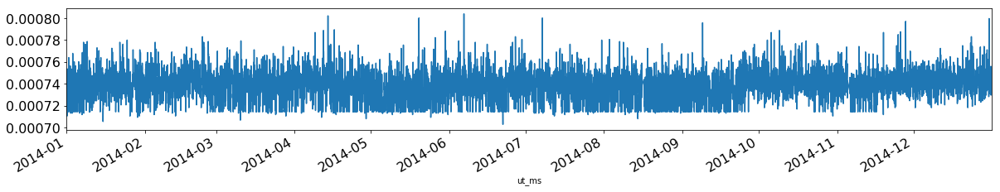

In [4]:
plt.figure(figsize=(20, 3))
power_df['NPWD2471'].plot(fontsize=16)

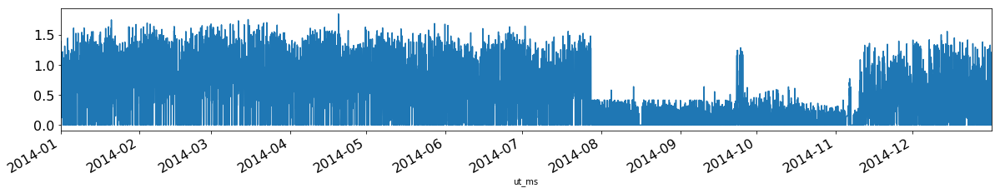

In [5]:
plt.figure(figsize=(20, 3))
power_df['NPWD2551'].plot(fontsize=16)

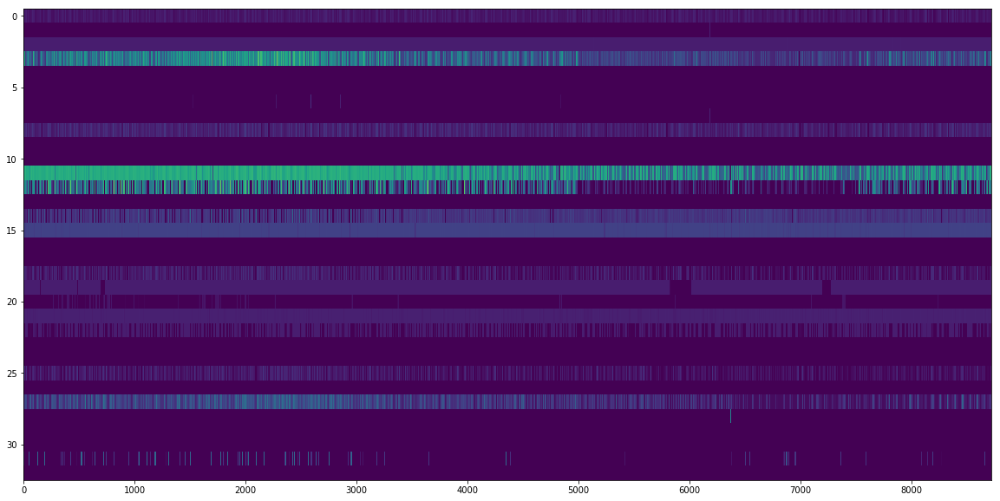

In [4]:
cols = [c for c in power_df.columns if c.startswith("NPWD")]
power_data = power_df[cols].values.T

plt.figure(figsize=(20, 10))
plt.imshow(power_data, aspect='auto', interpolation='nearest')

In [4]:
start_date, end_date = power_df.index[0], power_df.index[-1]
start_date, end_date

(Timestamp('2014-01-01 00:00:00'), Timestamp('2014-12-31 23:00:00'))

In [5]:
power_df_test = parse_data('../data/hackathon/sample_power_zeros--2015-01-01_2015-07-01.csv')
power_df_test

,NPWD2372,NPWD2401,NPWD2402,NPWD2451,NPWD2471,NPWD2472,NPWD2481,NPWD2482,NPWD2491,NPWD2501,...,NPWD2792,NPWD2801,NPWD2802,NPWD2821,NPWD2851,NPWD2852,NPWD2871,NPWD2872,NPWD2881,NPWD2882
ut_ms,,,,,,,,,,,,,,,,,,,,,
2015-01-01 00:00:00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2015-01-01 01:00:00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2015-01-01 02:00:00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2015-01-01 03:00:00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2015-01-01 04:00:00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2015-01-01 05:00:00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2015-01-01 06:00:00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2015-01-01 07:00:00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2015-01-01 08:00:00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [6]:
start_date_test, end_date_test = power_df_test.index[0], power_df_test.index[-1]
start_date_test, end_date_test

(Timestamp('2015-01-01 00:00:00'), Timestamp('2015-06-30 23:00:00'))

In [7]:
dmop_24h_df = load_dataframe("../data/hackathon/2014_2015_24h_dmop/simple_dmop_24h.csv")
dmop_24h_df.shape

(365, 13)

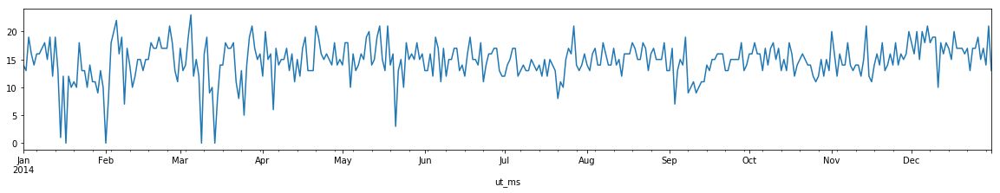

In [12]:
plt.figure(figsize=(20, 3))
dmop_24h_df['dmop_count_24h_AAAA'].plot()

In [8]:
saaf_df = load_dataframe("../data/hackathon/context--2014-01-01_2015-01-01--saaf.csv")
saaf_df.head()

,sa,sx,sy,sz
ut_ms,,,,
2014-01-01 00:00:00,6.003000,30.058917,90.000000,120.058917
2014-01-01 01:00:00,8.751892,21.132432,89.998514,111.132432
2014-01-01 02:00:00,2.335902,13.328525,89.998197,103.328525
2014-01-01 03:00:00,5.060000,29.074912,89.994386,119.074912
2014-01-01 05:00:00,9.049074,41.438889,86.696111,129.694444


In [10]:
saaf_df.shape

(8135, 4)

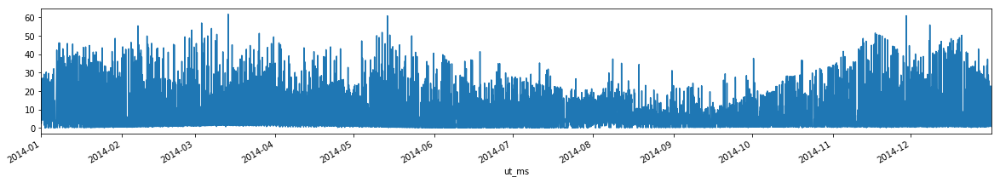

In [15]:
plt.figure(figsize=(20, 3))
saaf_df['sa'].plot()

In [9]:
ltdata_df = load_dataframe("../data/hackathon/context--2014-01-01_2015-01-01--ltdata.csv")
ltdata_df.head()

,sunmars_km,earthmars_km,sunmarsearthangle_deg,solarconstantmars,eclipseduration_min,occultationduration_min
ut_ms,,,,,,
2014-01-01,2.492364e+08,2.041964e+08,36.165104,492.128446,0.0,52.016667
2014-01-02,2.492387e+08,2.027023e+08,36.170689,492.119513,0.0,51.900000
2014-01-03,2.492395e+08,2.012069e+08,36.172424,492.116468,0.0,51.733333
2014-01-04,2.492387e+08,1.997103e+08,36.170228,492.119311,0.0,51.600000
2014-01-05,2.492365e+08,1.982128e+08,36.164022,492.128042,0.0,51.383333


In [12]:
ltdata_df.shape

(365, 6)

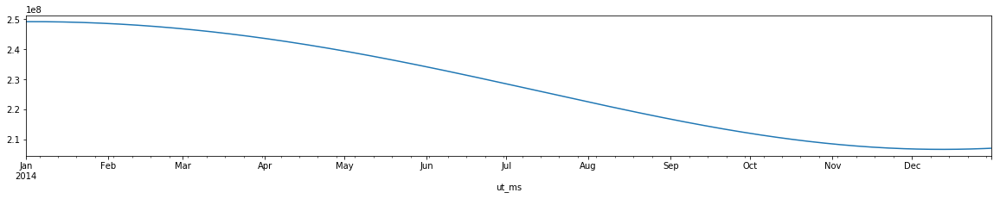

In [18]:
plt.figure(figsize=(20, 3))
ltdata_df['sunmars_km'].plot()

In [10]:
method='nearest'
ltdata_df = align_to_power(ltdata_df, power_df, method=method)
saaf_df = align_to_power(saaf_df, power_df, method=method)
dmop_24h_df = align_to_power(dmop_24h_df, power_df, method=method)

In [11]:
all_data_df = pd.concat([power_df, ltdata_df, saaf_df, dmop_24h_df], axis=1)

In [15]:
all_data_df.shape, all_data_df.columns

((8723, 56),
 Index([u'NPWD2372', u'NPWD2401', u'NPWD2402', u'NPWD2451', u'NPWD2471',
        u'NPWD2472', u'NPWD2481', u'NPWD2482', u'NPWD2491', u'NPWD2501',
        u'NPWD2531', u'NPWD2532', u'NPWD2551', u'NPWD2552', u'NPWD2561',
        u'NPWD2562', u'NPWD2691', u'NPWD2692', u'NPWD2721', u'NPWD2722',
        u'NPWD2742', u'NPWD2771', u'NPWD2791', u'NPWD2792', u'NPWD2801',
        u'NPWD2802', u'NPWD2821', u'NPWD2851', u'NPWD2852', u'NPWD2871',
        u'NPWD2872', u'NPWD2881', u'NPWD2882', u'sunmars_km', u'earthmars_km',
        u'sunmarsearthangle_deg', u'solarconstantmars', u'eclipseduration_min',
        u'occultationduration_min', u'sa', u'sx', u'sy', u'sz',
        u'dmop_count_24h_AAAA', u'dmop_count_24h_AACF', u'dmop_count_24h_AHHH',
        u'dmop_count_24h_AMMM', u'dmop_count_24h_AOOO', u'dmop_count_24h_APSF',
        u'dmop_count_24h_ASSS', u'dmop_count_24h_ASXX', u'dmop_count_24h_ATMB',
        u'dmop_count_24h_ATTT', u'dmop_count_24h_AVVV', u'dmop_count_24h_AXXX',
      

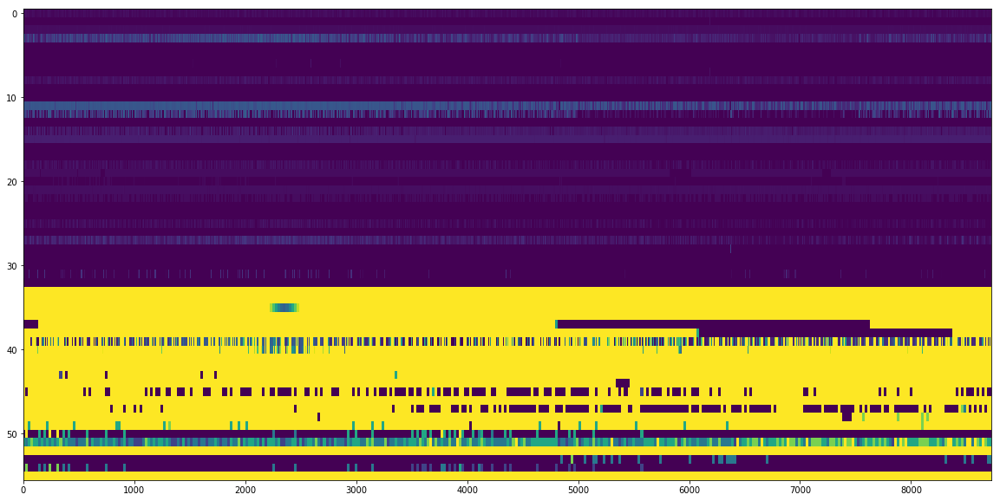

In [31]:
plt.figure(figsize=(20, 10))
plt.imshow(all_data_df.values.T, aspect='auto', vmin=0, vmax=5)

In [18]:
names = ['NPWD2372',
 'NPWD2401',
 'NPWD2402',
 'NPWD2451',
 'NPWD2471',
 'NPWD2472',
 'NPWD2481',
 'NPWD2482',
 'NPWD2491',
 'NPWD2501',
 'NPWD2531',
 'NPWD2532',
 'NPWD2551',
 'NPWD2552',
 'NPWD2561',
 'NPWD2562',
 'NPWD2691',
 'NPWD2692',
 'NPWD2721',
 'NPWD2722',
 'NPWD2742',
 'NPWD2771',
 'NPWD2791',
 'NPWD2792',
 'NPWD2801',
 'NPWD2802',
 'NPWD2821',
 'NPWD2851',
 'NPWD2852',
 'NPWD2871',
 'NPWD2872',
 'NPWD2881',
 'NPWD2882']

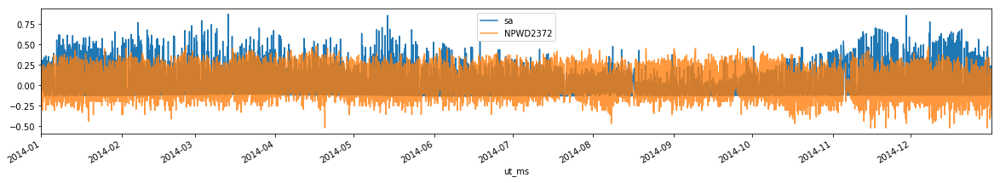

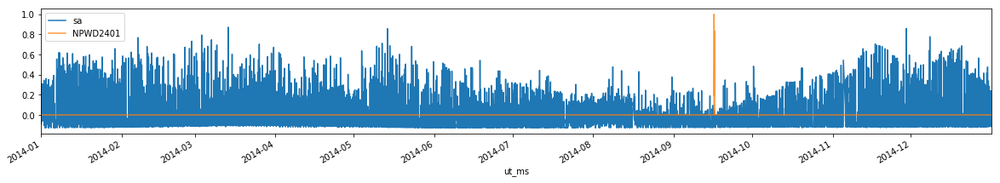

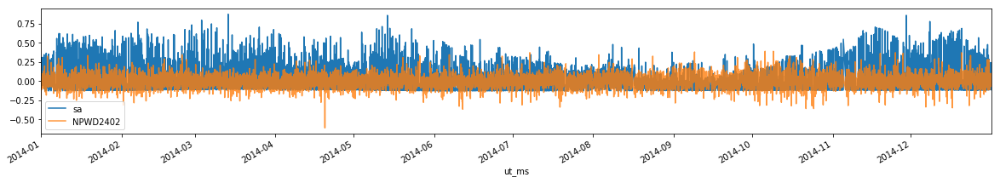

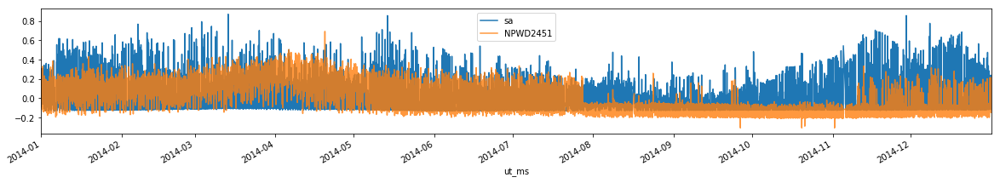

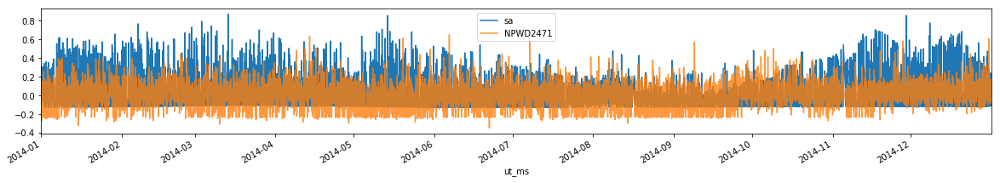

...

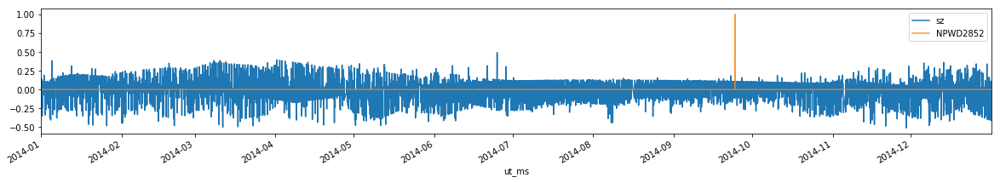

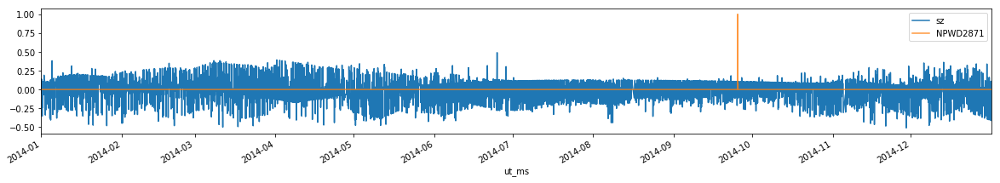

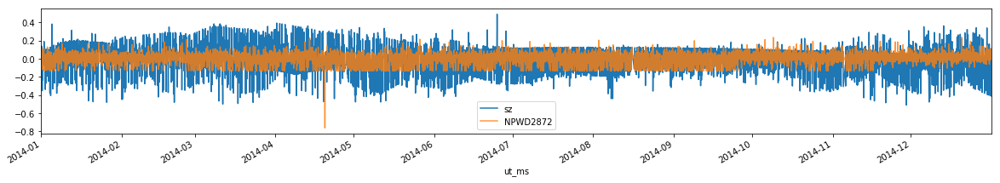

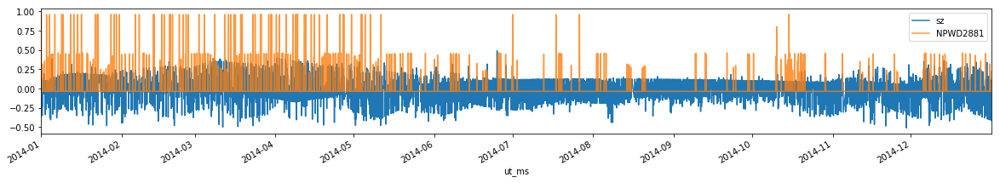

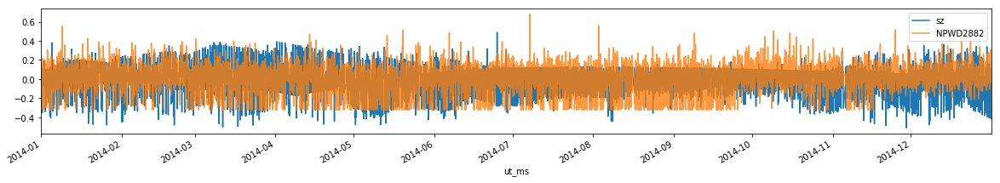

In [24]:
# Our attempt to look into data
count = 0
for x in ['sa', 'sx', 'sy', 'sz']:
    for y in names:
        plt.figure(figsize=(20, 3))
        ax = plt.subplot(1,1,1)
        df_norm = (all_data_df[[x]] - all_data_df[[x]].mean()) / (all_data_df[[x]].max() - all_data_df[[x]].min())
        (df_norm).plot(ax=ax)
        fd_norm = (all_data_df[[y]] - all_data_df[[y]].mean()) / (all_data_df[[y]].max() - all_data_df[[y]].min())
        fd_norm.plot(ax=ax,alpha=0.8)
        count += 1

In [ ]:
# Create 
all_data_df['usbx'] = np.cos(all_data_df['sx'])*np.sin(all_data_df['sa']) \
                        *np.sin(all_data_df['sz']) + np.sin(all_data_df['sx'])*np.cos(all_data_df['sa'])

all_data_df['usby'] = -np.sin(all_data_df['sx'])*np.sin(all_data_df['sa']) \
                        *np.sin(all_data_df['sz']) + np.cos(all_data_df['sx'])*np.cos(all_data_df['sa'])

all_data_df['usbz'] = np.cos(all_data_df['sz'])*np.sin(all_data_df['sa'])

In [24]:
all_data_df[['usbx', 'usby', 'usbz']].describe()

,usbx,usby,usbz
count,8723.000000,8723.000000,8723.000000
mean,0.092603,0.054454,0.015236
std,0.627382,0.599026,0.485696
min,-0.999989,-0.999999,-0.998303
25%,-0.481718,-0.457480,-0.331840
50%,0.150302,0.108773,0.013827
75%,0.684553,0.560282,0.358550
max,0.999962,0.999966,0.999717
